In [1]:
import numpy as np
import os
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

In [2]:
def camera_calibration(images):
    
    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2) #x,y coordinates


    

    # Step through the list and search for chessboard corners
    for idx, fname in enumerate(images):
     
        img = mpimg.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        corner_img=np.copy(img)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            cv2.drawChessboardCorners(corner_img, (9,6), corners, ret)
            
            f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
            ax1.imshow(img)
            ax1.set_title('Original Image', fontsize=30)
            ax2.imshow(corner_img)
            ax2.set_title('Corners_found', fontsize=30)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
            
    return ret, mtx, dist, rvecs, tvecs

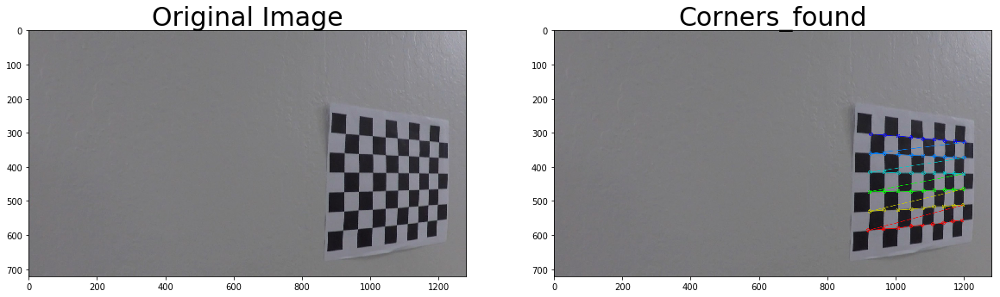

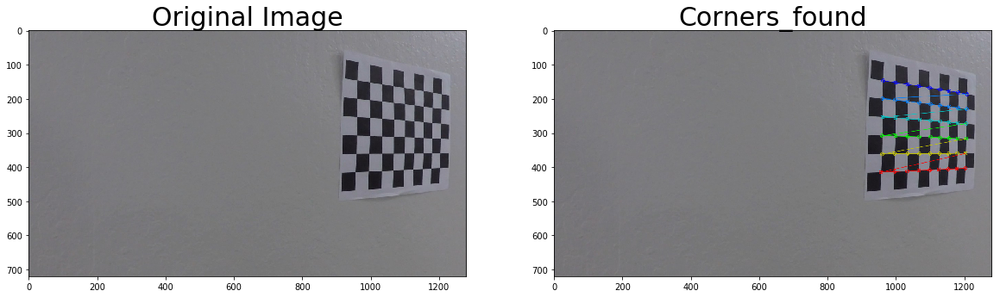

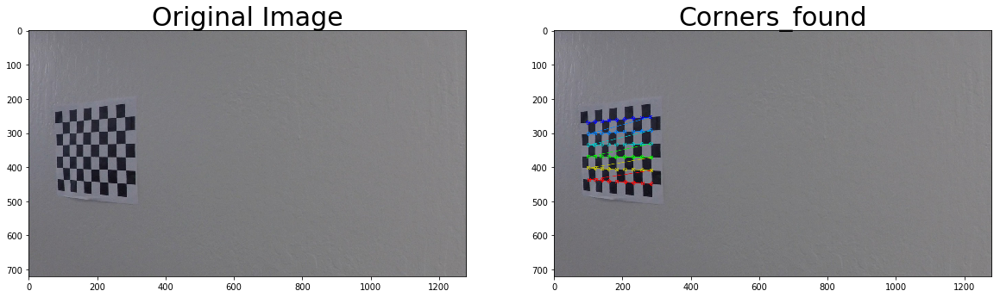

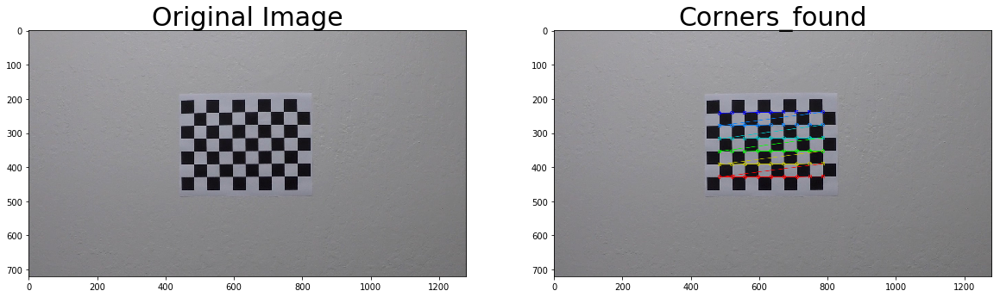

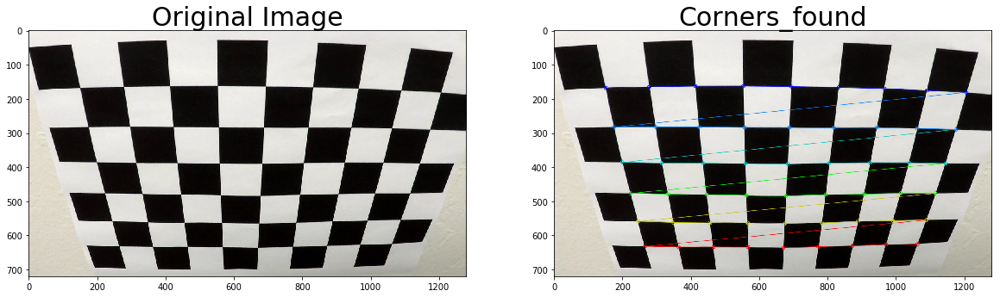

...

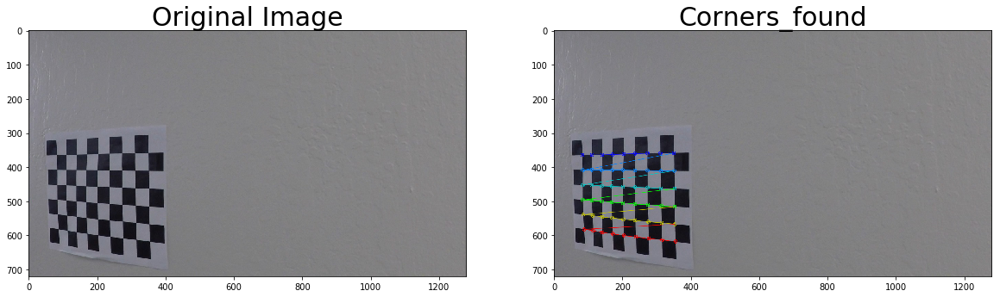

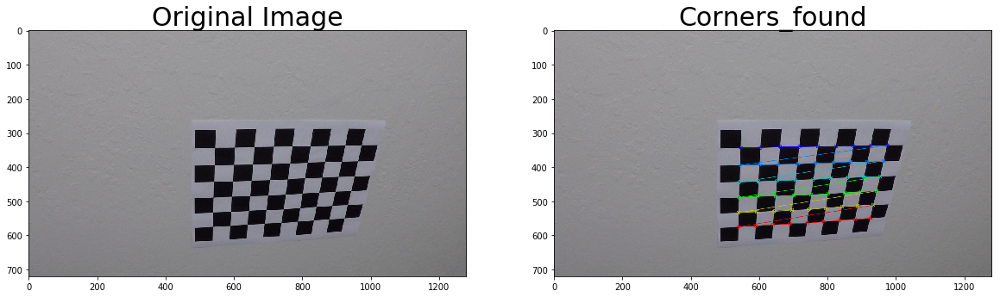

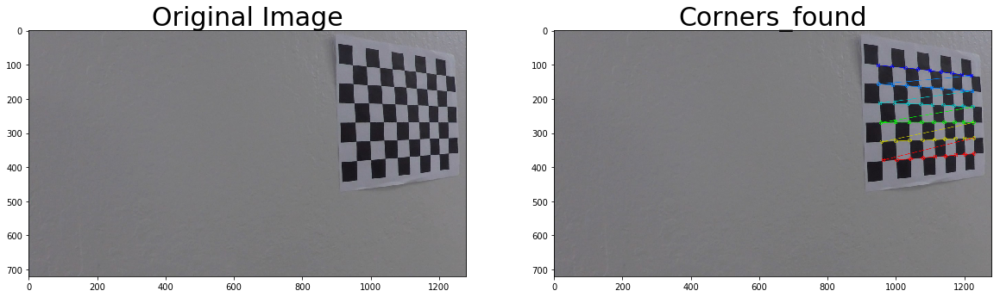

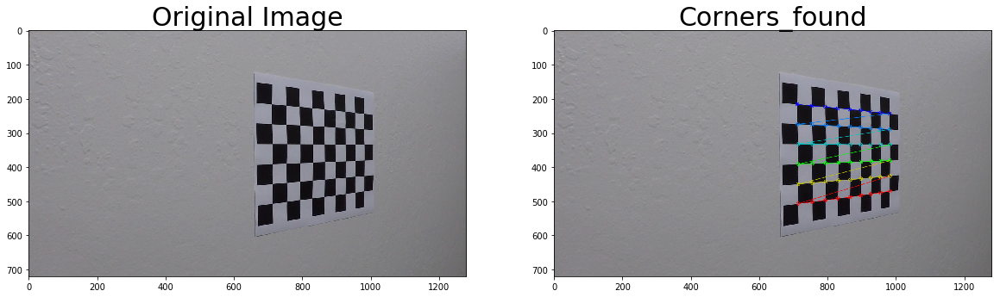

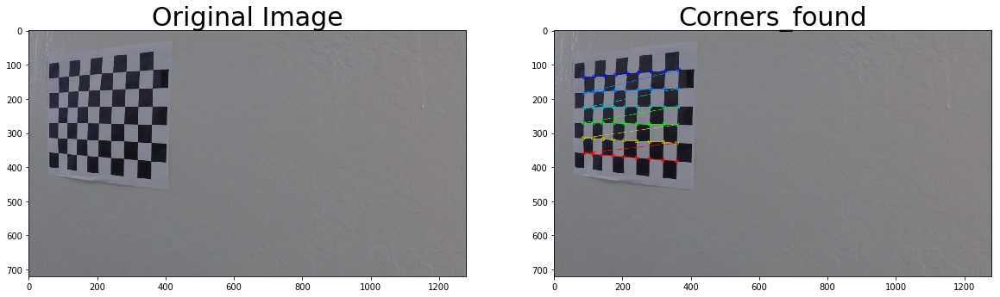

In [3]:
# Make a list of calibration images
distort_images = glob.glob('camera_cal/calibration*.jpg')
ret, mtx, dist, rvecs, tvecs=camera_calibration(distort_images)

In [4]:
def cal_undistort(img,mtx,dist):
    undist=cv2.undistort(img,mtx,dist,None,mtx)
    return undist

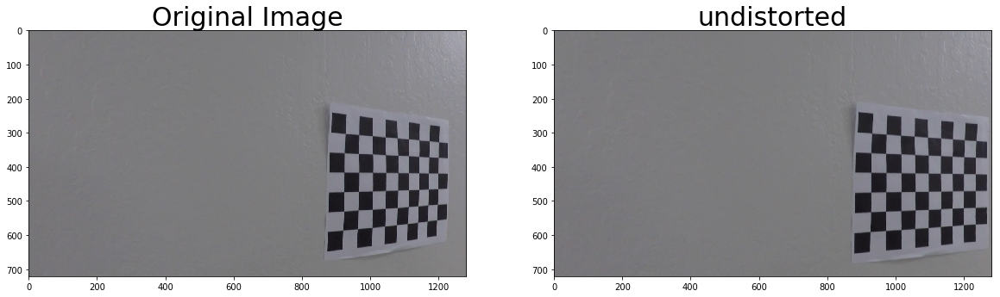

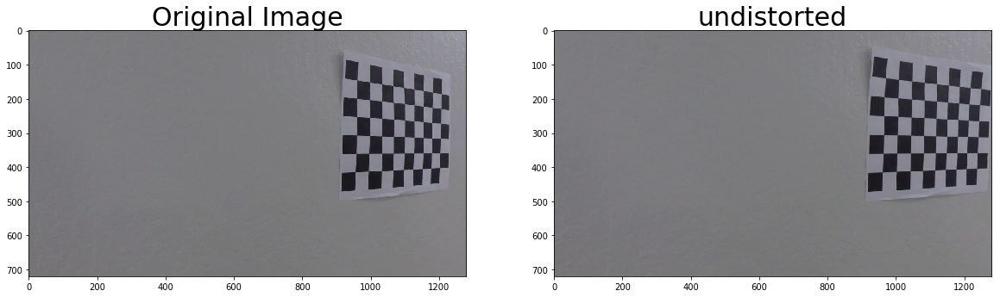

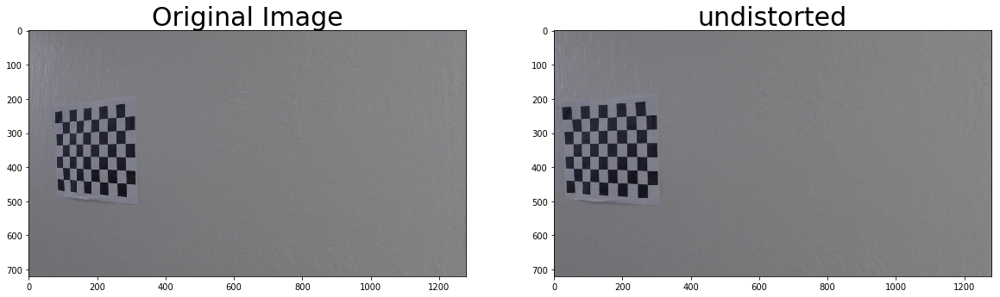

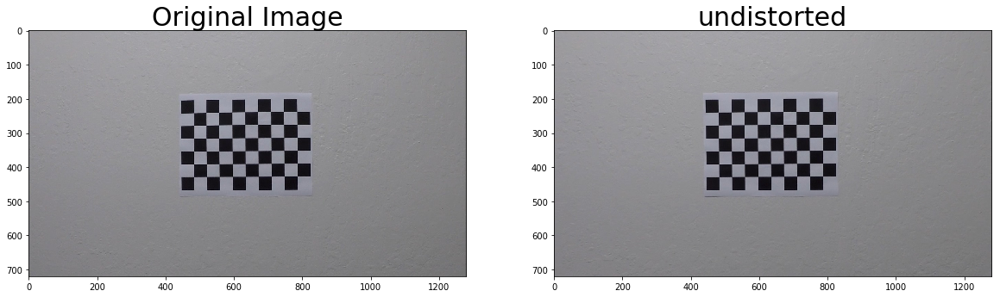

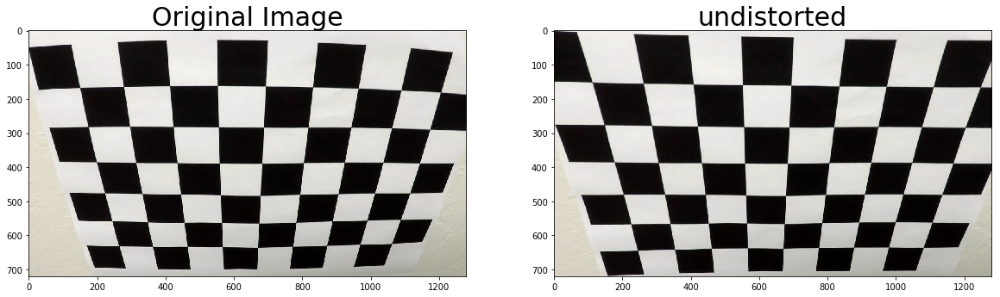

...

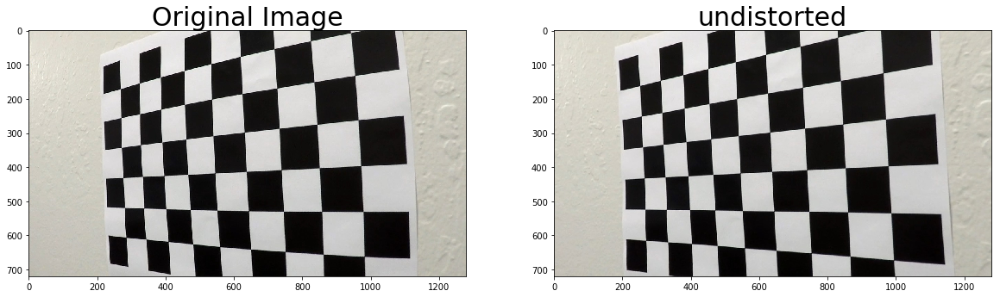

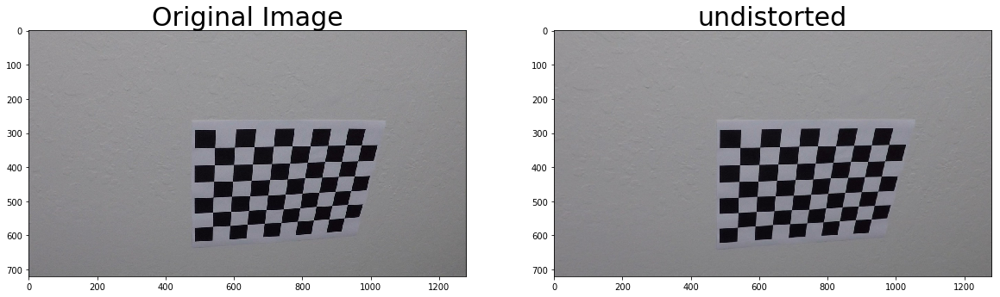

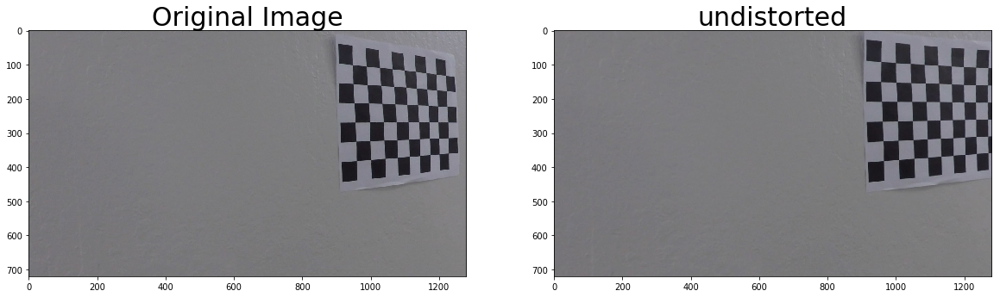

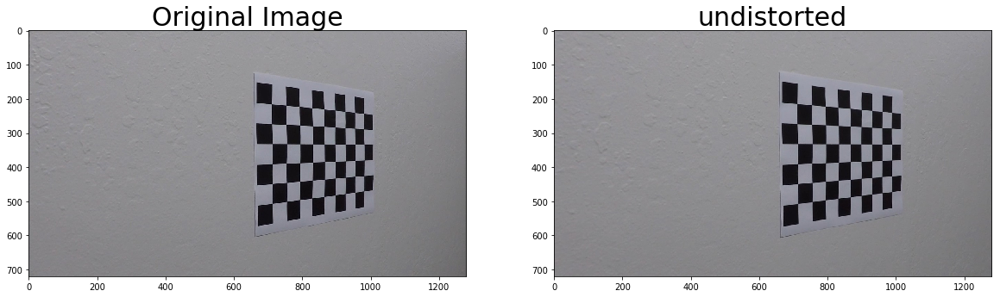

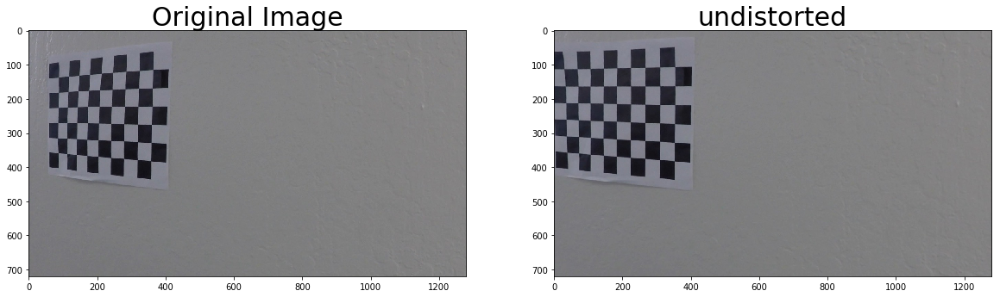

In [5]:
for source_img in os.listdir("camera_cal/"):
    
    image = mpimg.imread("camera_cal/"+source_img)
    
    
    undist = cal_undistort(image,mtx,dist)
    mpimg.imsave("output_images/calibrationundistorted/undistorted_"+source_img,undist)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(undist)
    ax2.set_title('undistorted', fontsize=30)

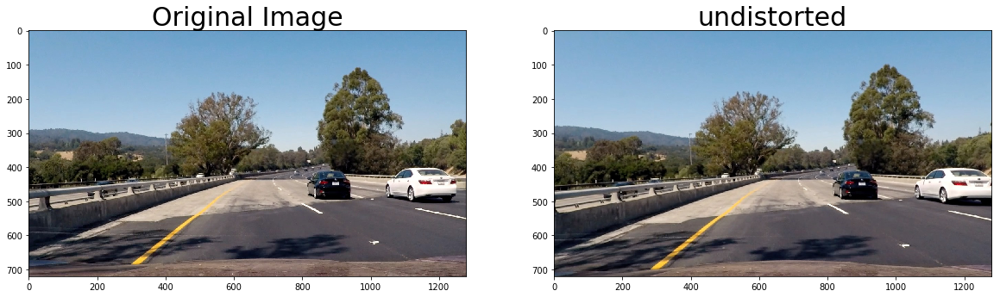

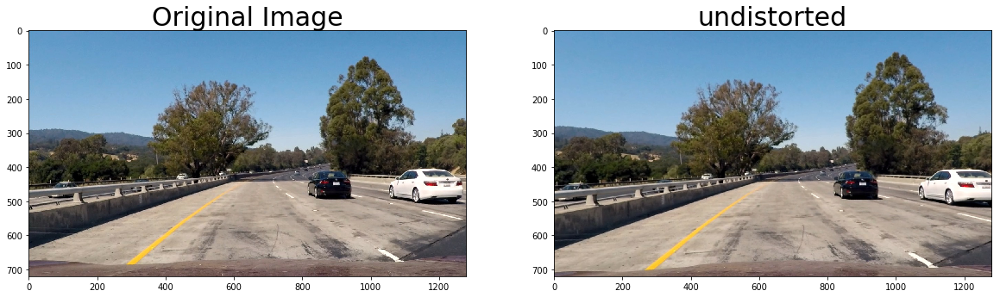

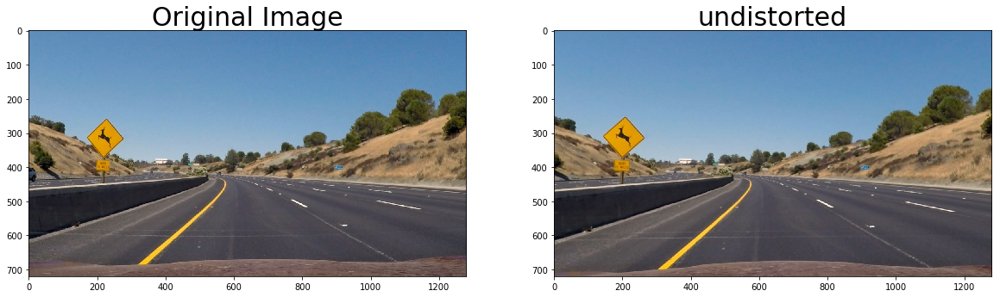

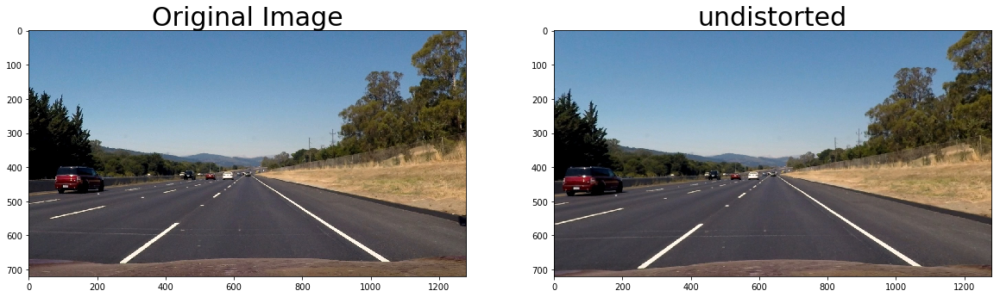

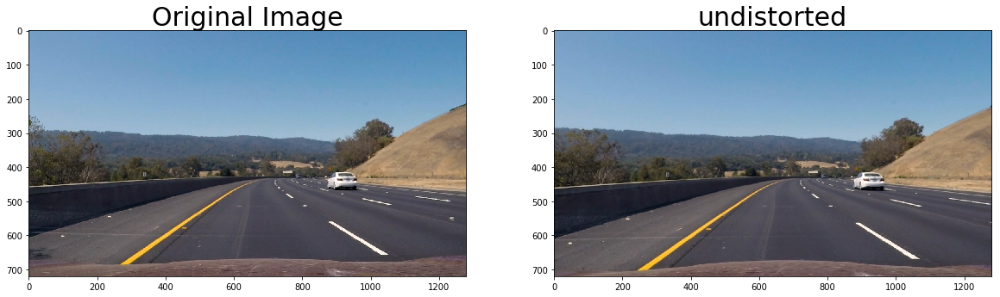

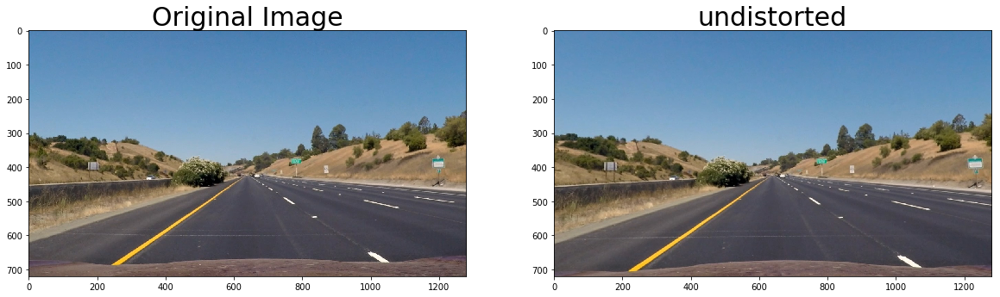

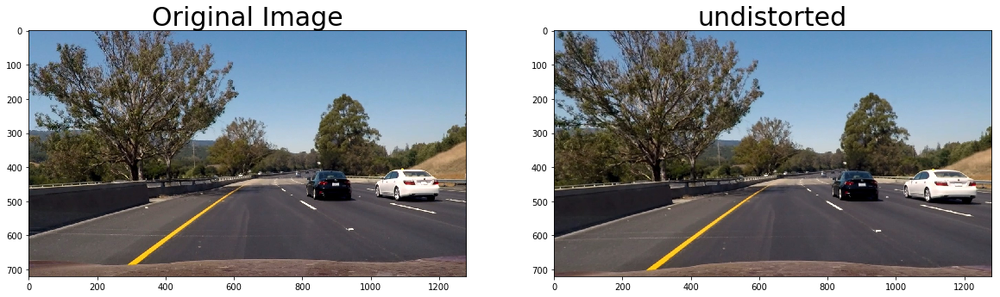

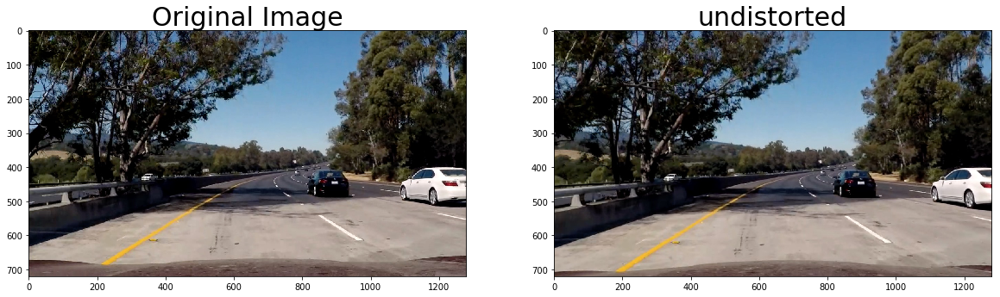

In [6]:
for source_img in os.listdir("test_images/"):
    
    image = mpimg.imread("test_images/"+source_img)
    
    
    
    undist = cal_undistort(image,mtx,dist)
    mpimg.imsave("output_images/undistorted/undistored_"+source_img,undist)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(undist)
    ax2.set_title('undistorted', fontsize=30)

In [14]:
def abs_sobel_thresh(img, orient='x', thresh_min=25, thresh_max=100):
    """
    Takes an image, gradient orientation, and threshold min/max values
    """
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(30, 100)):
    """
    Return the magnitude of the gradient
    for a given sobel kernel size and threshold values
    """
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255
    gradmag = (gradmag/scale_factor).astype(np.uint8)
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output


def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    """
    Return the direction of the gradient
    for a given sobel kernel size and threshold values
    """
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction,
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output



def hls_select(img, sthresh=(0, 255),lthresh=()):
    # 1) Convert to HLS color space
    hls_img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # 2) Apply a threshold to the S channel
    L = hls_img[:,:,1]
    S = hls_img[:,:,2]
    # 3) Return a binary image of threshold result
    binary_output = np.zeros_like(S)
    binary_output[(S >= sthresh[0]) & (S <= sthresh[1])
                 & (L > lthresh[0]) & (L <= lthresh[1])] = 1
    return binary_output


def combined_thresh(img):
    
    #Sobel x and y
    x_binary = abs_sobel_thresh(img, orient='x', thresh_min=25, thresh_max=200)
    y_binary = abs_sobel_thresh(img, orient='y', thresh_min=25, thresh_max=200)
    #magnitude and direction
    mag_bin = mag_thresh(img, sobel_kernel=3, mag_thresh=(30, 100))
    dir_bin = dir_threshold(img, sobel_kernel=3, thresh=(0.8, 1.2))
    #color channels
    s_binary = hls_select(img, sthresh=(140, 255), lthresh=(120, 255))

    combined = np.zeros_like(s_binary)
    combined[((x_binary == 1) & (y_binary == 1)) | ((mag_bin == 1) & (dir_bin == 1))] = 1
    final_binary = cv2.bitwise_or(s_binary, combined)
    

    return final_binary  

In [65]:
def compute_perspective_transform(binary_image):
        # Define 4 source and 4 destination points = np.float32([[,],[,],[,],[,]])
        shape = binary_image.shape[::-1]
        #print(shape)
        # (width,height)
        w = shape[0]
        h = shape[1]
        #x = shape[1]
        #print(x)
        
        #y = shape[0]
        #print(y)
        transform_src = np.float32([ [580,450], [160,h], [1150,h], [740,450]])
        transform_dst = np.float32([ [0,0], [0,h], [w,h], [w,0]])
        #transform_src = np.float32([[0.117 * x, y],[(0.5 * x) - (x*0.078), (2/3)*y],[(0.5 * x) + (x*0.078), (2/3)*y],[x - (0.117 * x), y]])
        #transform_dst=np.float32([[0.25 * x, y],[0.25 * x, 0],[x - (0.25 * x), 0],[x - (0.25 * x), y]])
        M = cv2.getPerspectiveTransform(transform_src, transform_dst)
        Minv = cv2.getPerspectiveTransform(transform_dst, transform_src)
        return M,Minv

def apply_perspective_transform(binary_image, M):
        warped_image = cv2.warpPerspective(binary_image, M, (binary_image.shape[1], binary_image.shape[0]), flags=cv2.INTER_NEAREST)  # keep same size as input image
        #if(plot):
            # Ploting both images Binary and Warped
            #f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
            #ax1.set_title('Binary/Undistorted and Tresholded')
            #ax1.imshow(binary_image, cmap='gray')
            #ax2.set_title('Binary/Undistorted and Warped Image')
            #ax2.imshow(warped_image, cmap='gray')
            #plt.show()

        return warped_image

In [66]:
def line_fit(binary_warped):
    
    global window_search
    
    """
    Find and fit lane lines
    """
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint]) 
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2)
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Assume you now have a new warped binary image
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
  
    return left_fit,right_fit



def tune_fit(binary_warped, left_fit,right_fit):
    
    #global window_search
    global window_search
    
    global frame_count
    
    # repeat window search to maintain stability
    if frame_count % 10 == 0:
        window_search=True
        
    # Assume you now have a new warped binary image
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fit,right_fit,leftx,lefty,rightx,righty


# A function to get quadratic polynomial output
def get_val(y,poly_coeff):
    
    return poly_coeff[0]*y**2+poly_coeff[1]*y+poly_coeff[2]

def calc_curve(binary_warped,left_fit,right_fit):
    """
    Calculate radius of curvature in meters
    """
    #generating y values
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
     # measure radius at the maximum y value, or bottom of the image
    # this is closest to the car 
    y_eval = np.max(ploty)
    

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # x positions lanes
    leftx = get_val(ploty,left_fit)
    rightx = get_val(ploty,right_fit)

    

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # averaged radius of curvature of left and right in real world space
    # should represent approximately the center of the road
    curve_rad = round((left_curverad + right_curverad)/2)

    return curve_rad


def calc_vehicle_offset(undist, left_fit, right_fit):
    """
    Calculate vehicle offset from lane center, in meters
    """
   
    
    ## find where lines hit the bottom of the image, closest to the car
    left_low = get_val(undist.shape[0],left_fit)
    right_low = get_val(undist.shape[0],right_fit)
    
    # Calculate vehicle center offset in pixels
    vehicle_offset = undist.shape[1]/2 - (left_low + right_low)/2.0
    
    # Convert pixel offset to meters
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    

    return (round(vehicle_offset *xm_per_pix,5))


def final_viz(undist, left_fit, right_fit, m_inv,warped):
    """
    Final lane line prediction visualized and overlayed on top of original image
    """
    # Generate x and y values for plotting
    ploty = np.linspace(0, undist.shape[0]-1, undist.shape[0])
    left_fitx = get_val(ploty,left_fit)
    right_fitx = get_val(ploty,right_fit)
    
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    #print(color_warp)

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, m_inv, (undist.shape[1], undist.shape[0]))
    #print(newwarp.shape)
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)

    
    
    return result

In [67]:
def img_pipeline(img):
    
    global window_search
    global left_fit_prev
    global right_fit_prev
    global frame_count
    global curve_radius
    global offset
        
    
    #correct lens distortion
    undist = cal_undistort(image,mtx,dist)
    #print(undist.shape)
    # get binary image
    binary_img = combined_thresh(undist)
    #perspective transform
    M,Minv=compute_perspective_transform(binary_img)
    birdseye = apply_perspective_transform(binary_img,M)
    #print(birdseye.shape)
    
    if window_search:
        #window_search = False
        #window search
        left_fit,right_fit = line_fit(birdseye)
        #store values
        left_fit_prev = left_fit
        right_fit_prev = right_fit
        
    else:
        #load values
        left_fit = left_fit_prev
        right_fit = right_fit_prev
        #search in margin of polynomials
        left_fit,right_fit,leftx,lefty,rightx,righty = tune_fit(birdseye, left_fit,right_fit)
    
    #save values
    left_fit_prev = left_fit
    right_fit_prev = right_fit
    
    #draw polygon
    processed_frame = final_viz(undist, left_fit, right_fit,Minv,birdseye)
    
    #update ~twice per second
    if frame_count==0 or frame_count%15==0:
        #measure radii
        curve_radius = calc_curve(birdseye,left_fit,right_fit)
        #measure offset
        offset = calc_vehicle_offset(undist, left_fit, right_fit)
    
        
    #printing information to frame
    font = cv2.FONT_HERSHEY_TRIPLEX
    processed_frame = cv2.putText(processed_frame, 'Radius: '+str(curve_radius)+' m', (30, 40), font, 1, (0,255,0), 2)
    processed_frame = cv2.putText(processed_frame, 'Offset: '+str(offset)+' m', (30, 80), font, 1, (0,255,0), 2)
   
    frame_count += 1
    return processed_frame

In [68]:
filenames = os.listdir("test_images/")
global window_search
global frame_count
for filename in filenames:
    frame_count = 15
    window_search = True
    image = mpimg.imread('test_images/'+filename)
    lane_image = img_pipeline(image)
    mpimg.imsave('output_images/lane_'+filename,lane_image)

In [71]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [73]:
global window_search 
global frame_count
window_search = True
frame_count = 0

for filename in ['project_video.mp4']:
    #white_output = 'output_images/project_video.mp4'
    ## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
    ## To do so add .subclip(start_second,end_second) to the end of the line below
    ## Where start_second and end_second are integer values representing the start and end of the subclip
    ## You may also uncomment the following line for a subclip of the first 5 seconds
    ##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
    clip1 = VideoFileClip('output_images/'+filename) #subclip(0,5)
    out= clip1.fl_image(img_pipeline) #NOTE: this function expects color images!!
    out.write_videofile('output_images/processed_'+filename, audio=False,verbose=False)

OSError: MoviePy error: failed to read the duration of file output_images/project_video.mp4.
Here are the file infos returned by ffmpeg:

ffmpeg version 2.8.6 Copyright (c) 2000-2016 the FFmpeg developers
  built with gcc 4.8.2 (GCC) 20140120 (Red Hat 4.8.2-15)
  configuration: --prefix=/opt/conda --disable-doc --enable-shared --enable-static --extra-cflags='-Wall -g -m64 -pipe -O3 -march=x86-64 -fPIC -I/opt/conda/include' --extra-cxxflags='=-Wall -g -m64 -pipe -O3 -march=x86-64 -fPIC' --extra-libs='-L/opt/conda/lib -lz' --enable-pic --enable-gpl --enable-libx264
  libavutil      54. 31.100 / 54. 31.100
  libavcodec     56. 60.100 / 56. 60.100
  libavformat    56. 40.101 / 56. 40.101
  libavdevice    56.  4.100 / 56.  4.100
  libavfilter     5. 40.101 /  5. 40.101
  libswscale      3.  1.101 /  3.  1.101
  libswresample   1.  2.101 /  1.  2.101
  libpostproc    53.  3.100 / 53.  3.100
[mov,mp4,m4a,3gp,3g2,mj2 @ 0x1f46240] moov atom not found
output_images/project_video.mp4: Invalid data found when processing input


In [54]:
video='output_images/project_video.mp4'
HTML("""
<video width="1280" height="720" controls>
  <source src="{0}">
</video>
""".format(video))